# Exploratory Data Analysis of Sales.csv

## 1) Loading the libraries and the dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import grafici
from dython.nominal import associations
import numpy as np
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go

In [2]:
# read the data
sales = pd.read_csv('Cleaned_Data/sales.csv')

# dataset to merge
cars = pd.read_csv('Cleaned_Data/cars.csv')
users = pd.read_csv('Cleaned_Data/users.csv')

## 2) Preparing the data

In [3]:
# merge the cars
sales = pd.merge(sales, cars, on='car_id', how='left')

# merge the users
sales = pd.merge(sales, users, on='customer_id', how='left')

In [4]:
# check duplicates
print('Duplicates:', sales.duplicated().sum())

Duplicates: 0


In [5]:
# reset the index
sales.reset_index(drop=True, inplace=True)

In [6]:
# convert the date to datetime
sales['purchase_date'] = pd.to_datetime(sales['purchase_date'])
sales['release_date'] = pd.to_datetime(sales['release_date'])

In [7]:
# nans
sales.isnull().sum()

transaction_id         0
customer_id            0
car_id                 0
platform               0
purchase_date          0
purchase_price         0
user_review        65070
car_model              0
fuel_type              0
release_date           0
price                  0
user_first_name       21
user_last_name        11
gender                 0
email                 14
email_domain          14
dtype: int64

In [8]:
# shape
sales.shape

(74780, 16)

### 2.1) Feature engineering

In [9]:
# create a new column for the discount
sales['discount'] = sales['price'] - sales['purchase_price']

In [10]:
# create a new column for the car age
sales['car_age_days'] = (sales['purchase_date'] - sales['release_date']).dt.days

### 2.2) Associations

In [11]:
# copy the dataset
sales_dython = sales.copy()

In [12]:
# print all the column that have id in the name
id_columns = [col for col in sales_dython.columns if '_id' in col]
print("We are dropping the following columns:", id_columns)

# drop the id columns
sales_dython.drop(columns=id_columns, inplace=True)

We are dropping the following columns: ['transaction_id', 'customer_id', 'car_id']


In [13]:
sales_dython.dtypes

platform                   object
purchase_date      datetime64[ns]
purchase_price            float64
user_review               float64
car_model                  object
fuel_type                  object
release_date       datetime64[ns]
price                       int64
user_first_name            object
user_last_name             object
gender                     object
email                      object
email_domain               object
discount                  float64
car_age_days                int64
dtype: object

c:\Users\gabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\dython\nominal.py:632: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  lambda col: col.view(np.int64), axis=0


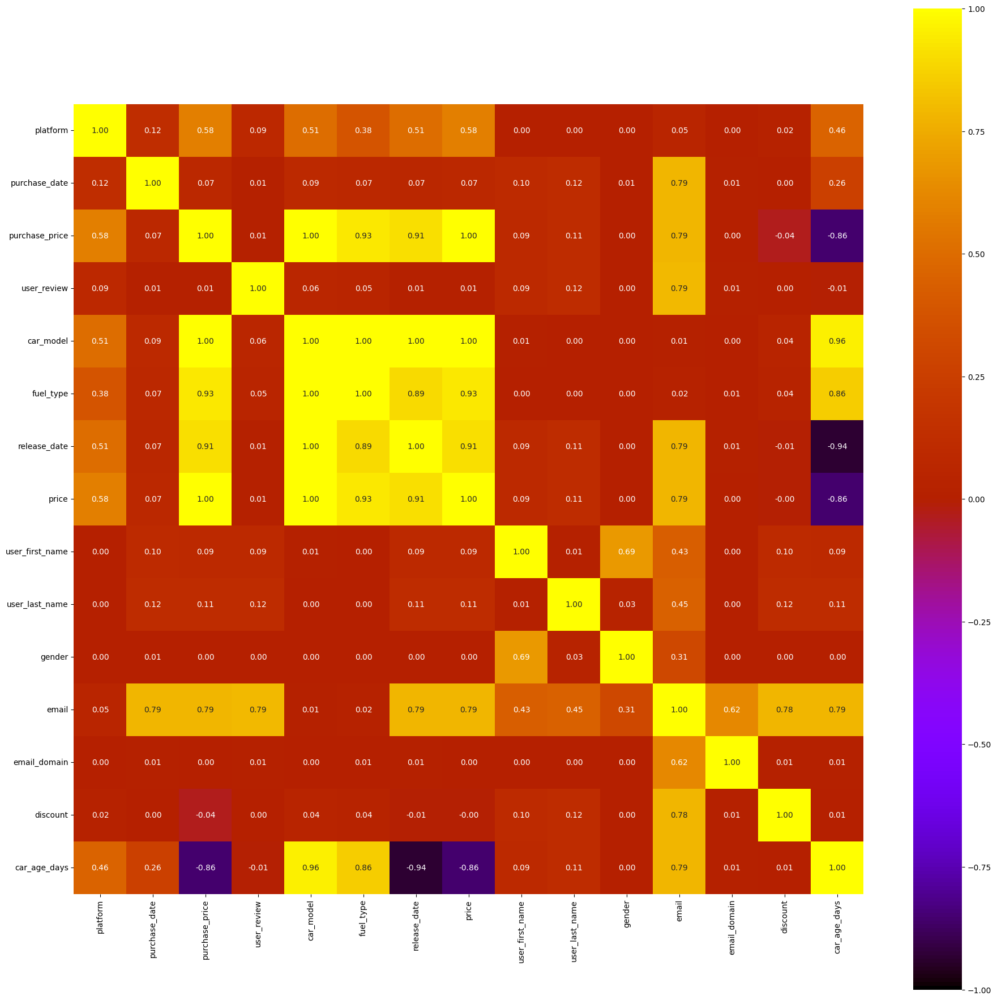

In [14]:
# Generate the correlation matrix
associations_sales = associations(sales_dython, multiprocessing=True, cmap='gnuplot',num_num_assoc='spearman')

It is nice to see that the gender dosen't affect the dataset

### 2.3) Scatter matrix

In [15]:
# plot the scatter plot matrix
px.scatter_matrix(sales.select_dtypes(include=[np.number])).show()

## 3) Analyse all columns one by one

In [16]:
sales.dtypes

transaction_id             object
customer_id                object
car_id                     object
platform                   object
purchase_date      datetime64[ns]
purchase_price            float64
user_review               float64
car_model                  object
fuel_type                  object
release_date       datetime64[ns]
price                       int64
user_first_name            object
user_last_name             object
gender                     object
email                      object
email_domain               object
discount                  float64
car_age_days                int64
dtype: object

### Platform column

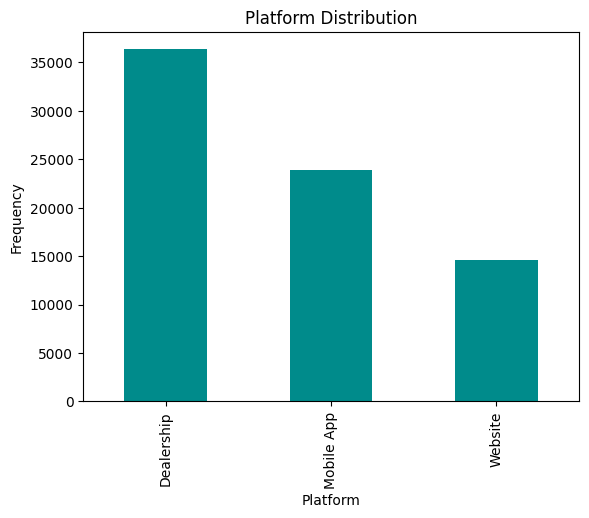

In [17]:
# plot the platform distribution
sales['platform'].value_counts().plot(kind='bar', color='darkcyan')
plt.title('Platform Distribution')
plt.xlabel('Platform')
plt.ylabel('Frequency')
plt.show()

This graph suggest that the platform that sells best is the Dealership, let's check

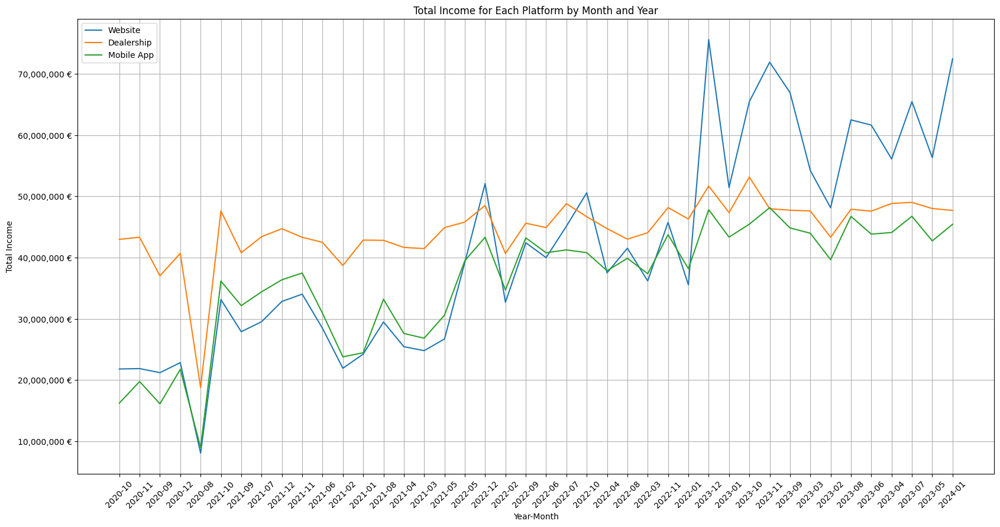

In [18]:
# Initialize the dictionary to store total income for each platform by month and year
monthly_income = {}

# Iterate over each platform
for platform in sales['platform'].unique():
    # Filter the sales data for the current platform
    platform_sales = sales[sales['platform'] == platform]
    
    # Iterate over each year and month
    for year in sorted(platform_sales['purchase_date'].dt.year.unique()):
        for month in platform_sales[platform_sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique():
            # Create a key for the dictionary
            key = f'{year}-{month:02d}'
            
            # Calculate the total income for the current platform, year, and month
            total_income = platform_sales[(platform_sales['purchase_date'].dt.year == year) & 
                                          (platform_sales['purchase_date'].dt.month == month)]['purchase_price'].sum()
            
            # Initialize the dictionary entry if it doesn't exist
            if key not in monthly_income:
                monthly_income[key] = {}
            
            # Store the total income in the dictionary
            monthly_income[key][platform] = total_income

# Plot the total income for each platform by month and year
plt.figure(figsize=(20, 10))
for platform in sales['platform'].unique():
    plt.plot(list(monthly_income.keys()), [income.get(platform, 0) for income in monthly_income.values()], label=platform)
plt.xlabel('Year-Month')
plt.ylabel('Total Income')
plt.title('Total Income for Each Platform by Month and Year')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,} €".format(int(x))))
plt.show()

Here we can see that the Website is performing the best, with a very positive trend. <br>The Dealership's revenue remains almost constant over time. <br>The Mobile App showed similar performance until January 2022, when the Website's revenue skyrocketed and doubled. This could be due to significant improvements in the Website or changes in customer behavior.

##### Platform hopping

Let's analyse how many people have changed platform, and which

In [19]:
# Identify users who have purchased cars from different platforms
multi_platform_users = sales.groupby('customer_id')['platform'].nunique() > 1
multi_platform_users = multi_platform_users[multi_platform_users].index
sales[sales['customer_id'].isin(multi_platform_users)].sort_values('purchase_date')

,transaction_id,customer_id,car_id,platform,purchase_date,purchase_price,user_review,car_model,fuel_type,release_date,price,user_first_name,user_last_name,gender,email,email_domain,discount,car_age_days
39858,9a8b1b4d-bbb8-4ea8-bd36-d221c480e79a,db1482ff-1a20-43c0-94c5-bcacba70d5ea,00b0c76e-9f2f-41c1-8324-38fbe9c2a8aa,Mobile App,2022-02-23,145000.0,NaN,Model i8,Electric,2019-01-01,145000,Simon,Norris,Male,simon@yahoo.com,yahoo.com,0.0,1149
44257,dacffbde-7463-48a8-a570-f1c7d0ac26f1,db1482ff-1a20-43c0-94c5-bcacba70d5ea,4abc60d6-73cb-44df-8bde-d8f5936bbdfb,Website,2022-09-25,65000.0,7.0,Coupe,Gasoline,2015-08-01,65000,Simon,Norris,Male,simon@yahoo.com,yahoo.com,0.0,2612
53125,d5c90962-0cef-4392-bee9-22e61d166b7b,40a8e90c-7b08-4958-9135-0d76684c922c,4abc60d6-73cb-44df-8bde-d8f5936bbdfb,Mobile App,2022-12-04,65000.0,NaN,Coupe,Gasoline,2015-08-01,65000,Maximilian,Young,Male,maximilian@outlook.com,outlook.com,0.0,2682
42240,2b16b88b-ad82-425b-8461-fc94cc958303,db1482ff-1a20-43c0-94c5-bcacba70d5ea,d2e63c70-e732-4299-bb0c-ba00b875a4bd,Dealership,2023-01-19,40000.0,NaN,3 Series,Diesel,2014-12-11,40000,Simon,Norris,Male,simon@yahoo.com,yahoo.com,0.0,2961
21755,4630b476-6817-4a37-a048-ff7f664707b8,40a8e90c-7b08-4958-9135-0d76684c922c,eee54c45-64fe-462b-b9c2-e23adea76282,Website,2023-05-19,30000.0,NaN,1 Series,Diesel,2010-10-01,30000,Maximilian,Young,Male,maximilian@outlook.com,outlook.com,0.0,4613
5165,436e735f-1f20-49d4-b652-68c1a1e87a69,40a8e90c-7b08-4958-9135-0d76684c922c,eee54c45-64fe-462b-b9c2-e23adea76282,Dealership,2023-05-30,30000.0,NaN,1 Series,Diesel,2010-10-01,30000,Maximilian,Young,Male,maximilian@outlook.com,outlook.com,0.0,4624
27285,fe834613-2120-4edf-82f8-17a0843a0952,db1482ff-1a20-43c0-94c5-bcacba70d5ea,0c048ea4-5e29-419e-a448-99f75742117c,Website,2023-07-20,70000.0,NaN,Model M,Gasoline,2016-04-01,70000,Simon,Norris,Male,simon@yahoo.com,yahoo.com,0.0,2666
39204,a529407a-d231-472d-b217-898f57d06c53,40a8e90c-7b08-4958-9135-0d76684c922c,2c192c40-f69f-42e5-9431-41d92558568b,Website,2023-10-11,35000.0,NaN,Sierra,Diesel,2013-05-01,35000,Maximilian,Young,Male,maximilian@outlook.com,outlook.com,0.0,3815


These insights are not very significant, as only two customers have purchased more than one car and they both had changed the platform multiple times (for no apparent reason)

#### Platform correlation with other columns

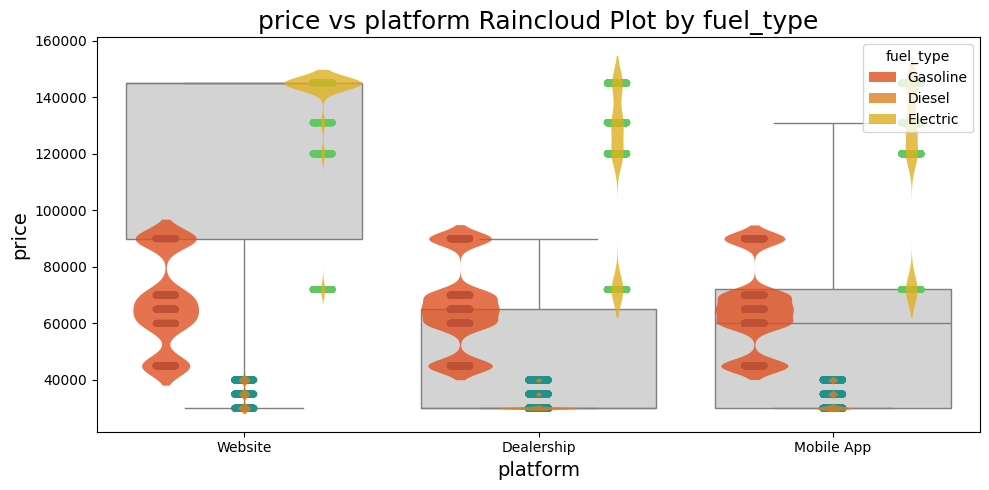

In [20]:
grafici.raincloud_plot(sales, 'price', 'platform', 'fuel_type', figsize=(10,5))

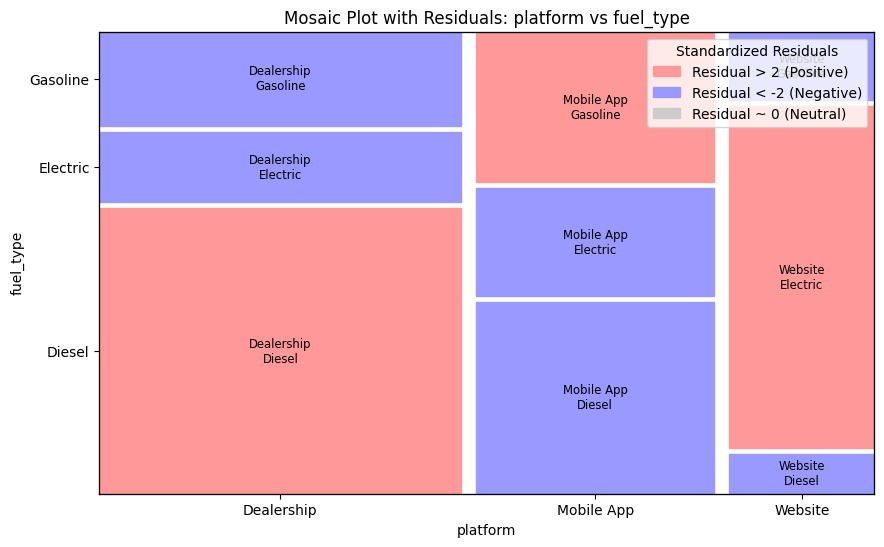

Chi-square Test Residuals:
fuel_type      Diesel    Electric   Gasoline
platform                                    
Dealership  48.400082  -49.874206 -11.405478
Mobile App  -8.040902  -17.289522  30.583881
Website    -66.129487  100.925835 -21.189960


In [21]:
grafici.create_mosaic_plot_with_legend(sales, ['platform', 'fuel_type'])

We can see that the Dealership sells more Diesel, the App sells more Gasoline and the Website sells more Electric cars

#### Price distribution by platform

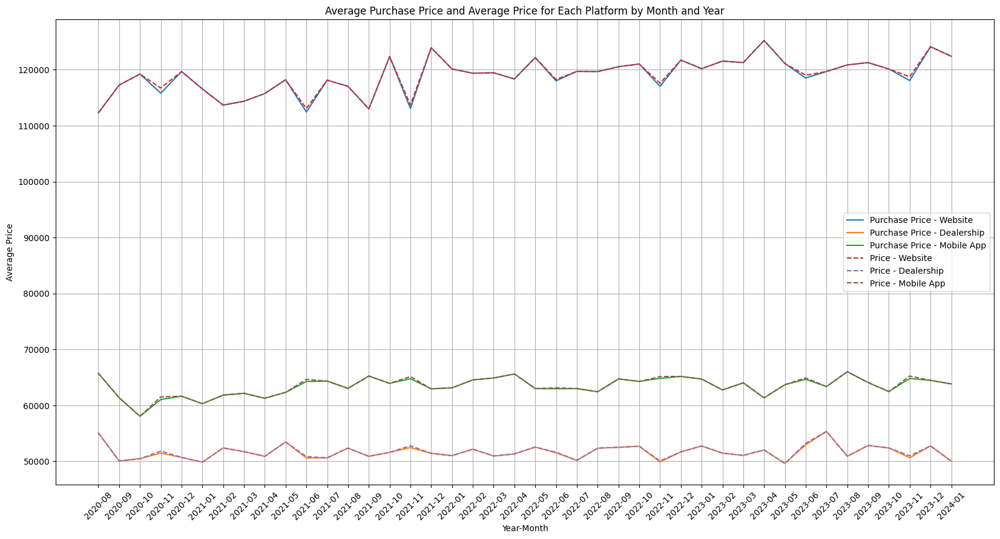

In [22]:
# Create a dictionary to store the average purchase price for each platform by month and year
avg_purchase_price = {}

# Iterate over each platform
for platform in sales['platform'].unique():
    # Filter the sales data for the current platform
    platform_sales = sales[sales['platform'] == platform]
    
    # Iterate over each year and month
    for year in sorted(platform_sales['purchase_date'].dt.year.unique()):
        for month in sorted(platform_sales[platform_sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique()):
            # Create a key for the dictionary
            key = f'{year}-{month:02d}'
            
            # Calculate the average purchase price for the current platform, year, and month
            avg_price = platform_sales[(platform_sales['purchase_date'].dt.year == year) & 
                                       (platform_sales['purchase_date'].dt.month == month)]['purchase_price'].mean()
            
            # Initialize the dictionary entry if it doesn't exist
            if key not in avg_purchase_price:
                avg_purchase_price[key] = {}
            
            # Store the average purchase price in the dictionary
            avg_purchase_price[key][platform] = avg_price

# Create a dictionary to store the average price for each platform by month and year
avg_price_dict = {}

# Iterate over each platform
for platform in sales['platform'].unique():
    # Filter the sales data for the current platform
    platform_sales = sales[sales['platform'] == platform]
    
    # Iterate over each year and month
    for year in sorted(platform_sales['purchase_date'].dt.year.unique()):
        for month in sorted(platform_sales[platform_sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique()):
            # Create a key for the dictionary
            key = f'{year}-{month:02d}'
            
            # Calculate the average price for the current platform, year, and month
            avg_price = platform_sales[(platform_sales['purchase_date'].dt.year == year) & 
                                       (platform_sales['purchase_date'].dt.month == month)]['price'].mean()
            
            # Initialize the dictionary entry if it doesn't exist
            if key not in avg_price_dict:
                avg_price_dict[key] = {}
            
            # Store the average price in the dictionary
            avg_price_dict[key][platform] = avg_price

# Plot the average purchase price for each platform by month and year
plt.figure(figsize=(20, 10))
for platform in sales['platform'].unique():
    plt.plot(list(avg_purchase_price.keys()), [price.get(platform, 0) for price in avg_purchase_price.values()], label=f'Purchase Price - {platform}')

# Add the price line for each platform divided by month and year
for platform in sales['platform'].unique():
    plt.plot(list(avg_price_dict.keys()), [price.get(platform, 0) for price in avg_price_dict.values()], linestyle='--', label=f'Price - {platform}')

plt.xlabel('Year-Month')
plt.ylabel('Average Price')
plt.title('Average Purchase Price and Average Price for Each Platform by Month and Year')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.show()

We can see that the most valuable cars are sold on the website, 
<br>the cheapest cars are bought at the dealership or via the mobile app, 
<br>but in the middle range the mobile app sells best.

We can also see that the discounts are applied on all of the three platforms.

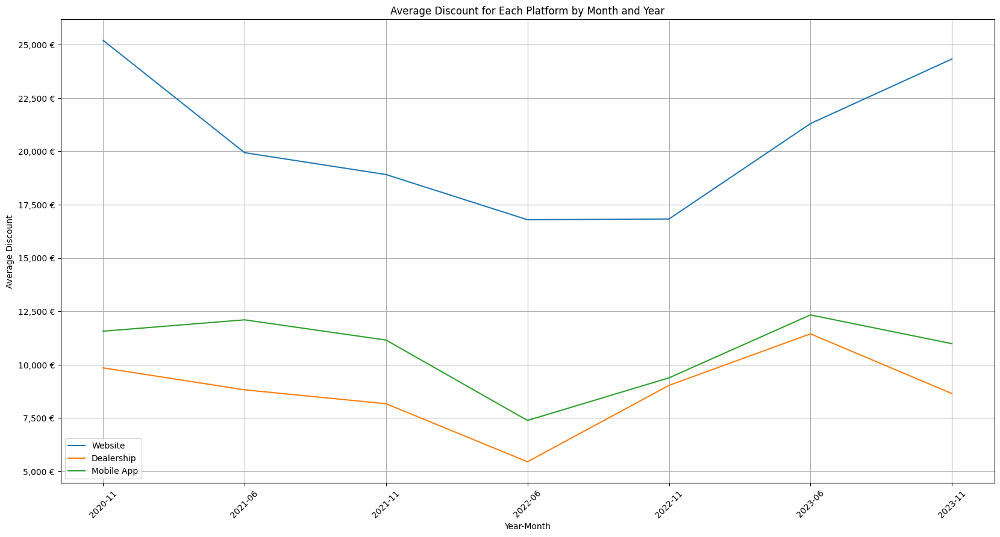

Website discount percentage: 17.38%
Dealership discount percentage: 17.43%
Mobile App discount percentage: 17.04%


In [23]:
monthly_avg_discount = {}

for platform in sales['platform'].unique():
    # filter
    platform_sales = sales[(sales['platform'] == platform) & (sales['discount'] > 0)]

    for year in sorted(platform_sales['purchase_date'].dt.year.unique()):
        for month in sorted(platform_sales[platform_sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique()):
            # create the key
            key = f'{year}-{month:02d}'
            
            # calculate the average discount for the current platform, year, and month
            avg_discount = platform_sales[(platform_sales['purchase_date'].dt.year == year) & 
                                          (platform_sales['purchase_date'].dt.month == month)]['discount'].mean()
            
            # initialize the dictionary entry if it doesn't exist
            if key not in monthly_avg_discount:
                monthly_avg_discount[key] = {}
            monthly_avg_discount[key][platform] = avg_discount

# plot the average discount for each platform by month and year
plt.figure(figsize=(20, 10))
for platform in sales['platform'].unique():
    plt.plot(list(monthly_avg_discount.keys()), [discount.get(platform, 0) for discount in monthly_avg_discount.values()], label=platform)
plt.xlabel('Year-Month')
plt.ylabel('Average Discount')
plt.title('Average Discount for Each Platform by Month and Year')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,} €".format(int(x))))
plt.show()

# print the percentage of discount for each platform
for platform in sales['platform'].unique():
    platform_sales = sales[(sales['platform'] == platform) & (sales['discount'] > 0)]
    total_discount = platform_sales['discount'].sum()
    total_price = platform_sales['price'].sum()
    print(f'{platform} discount percentage: {total_discount / total_price * 100:.2f}%')

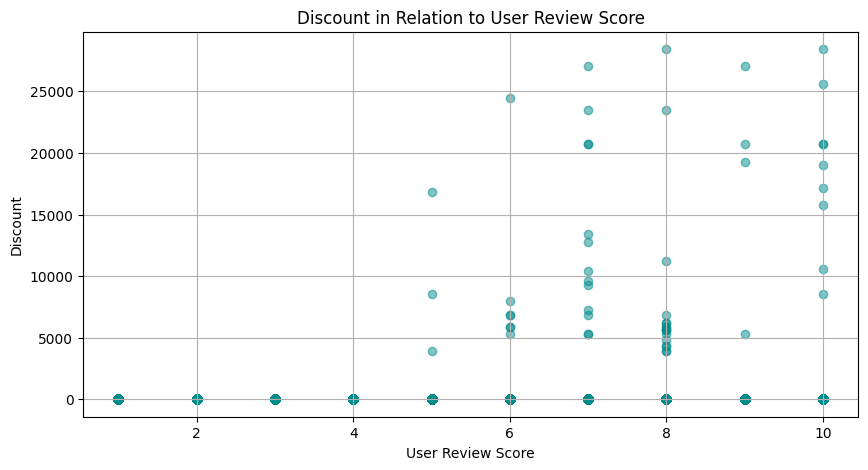

In [24]:
# plot the distribution of the discount in relation to the user reviews
plt.figure(figsize=(10, 5))
plt.scatter(sales['user_review'], sales['discount'], color='darkcyan', alpha=0.5)
plt.xlabel('User Review Score')
plt.ylabel('Discount')
plt.title('Discount in Relation to User Review Score')
plt.grid()
plt.show()

we can see that the discounts make the users happy

#### User reviews by platform

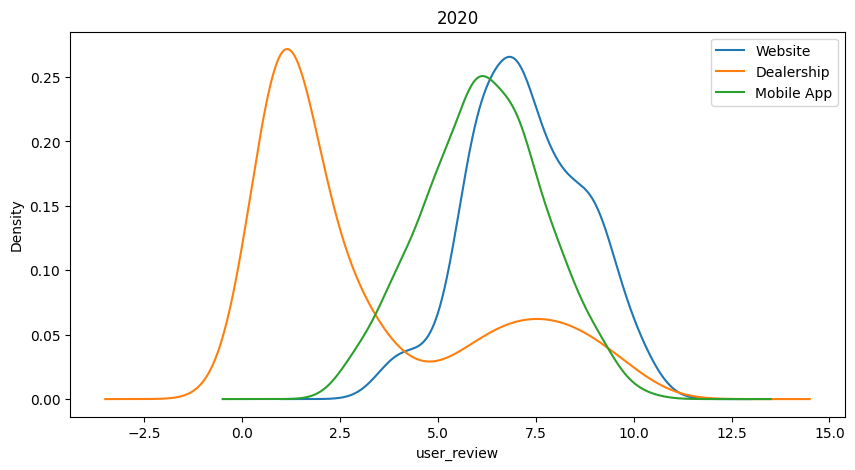

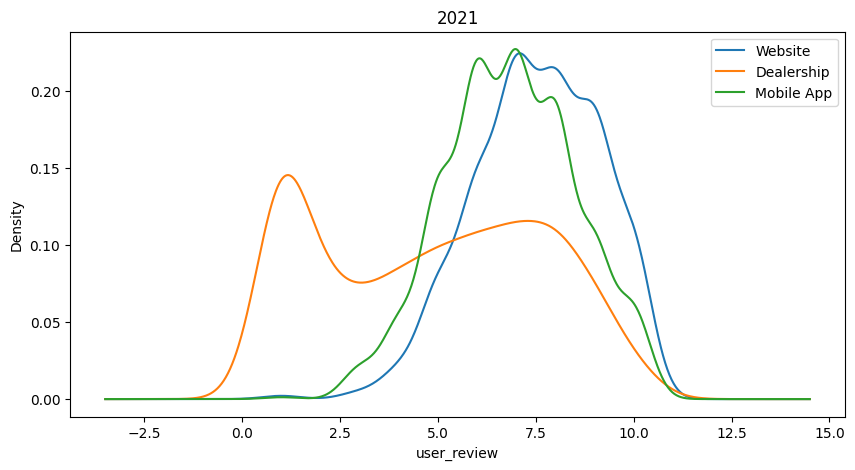

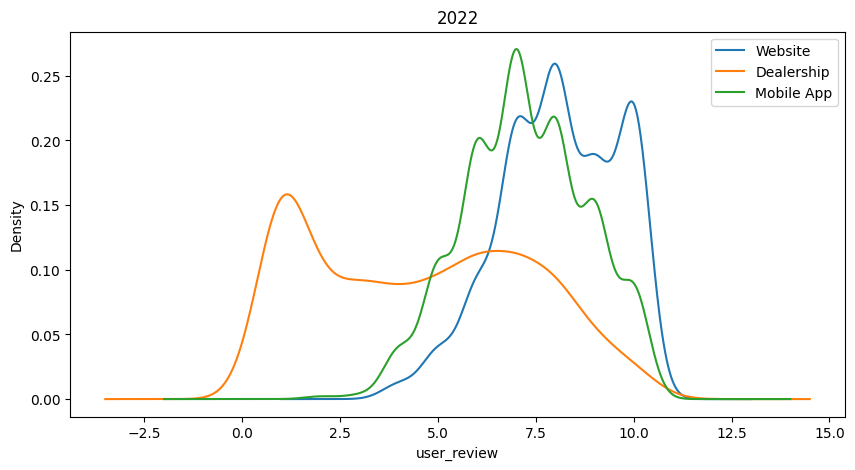

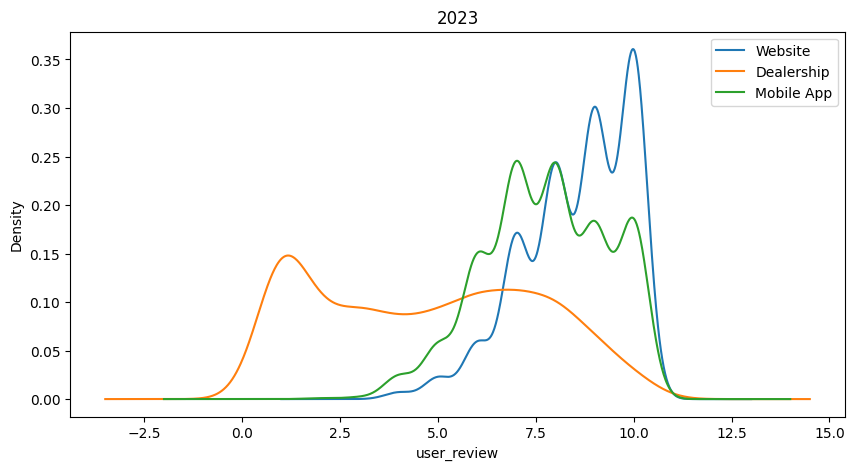

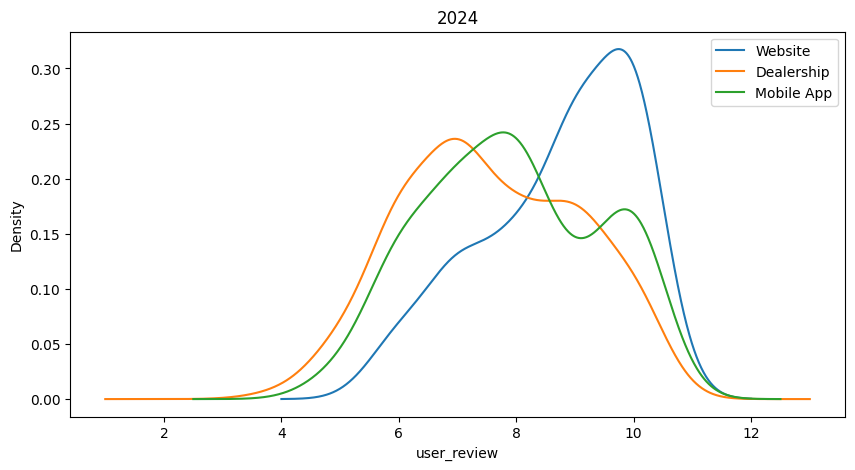

In [25]:
# plot the user_review distribution colored by the platform year after year
for year in sorted(sales['purchase_date'].dt.year.unique()):
    plt.figure(figsize=(10,5))
    for platform in sales['platform'].unique():
        sales[(sales['platform'] == platform) & (sales['purchase_date'].dt.year == year)]['user_review'].plot(kind='kde', label=platform)
    plt.xlabel('user_review')
    plt.legend()
    plt.title(year)
    plt.show()

Here we can clearly see that the customers that use the website leave the best reviews
<br>All reviews rated below "2" are conducted exclusively at the dealership. For the 2024 model, we only have data from January, so it's **too early** to determine if the issue has been resolved. This pattern occurs because, for various reasons, the average review score tends to decline throughout the year. Scores start high in January and gradually decrease as the months progress toward December, only for the cycle to reset every January.

<Axes: xlabel='purchase_date'>

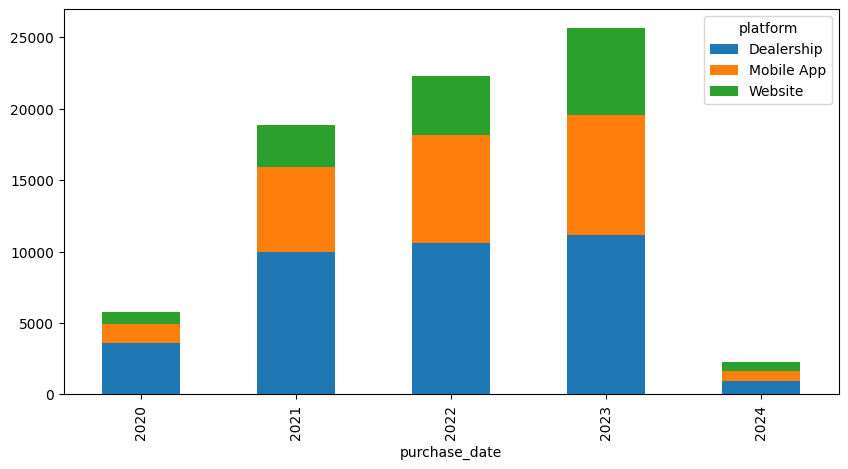

In [26]:
# to be sure let's count the number of sells for each platform for every year
sales.groupby([sales['purchase_date'].dt.year, 'platform']).size().unstack().plot(kind='bar', stacked=True, figsize=(10,5))

As previously demonstrated the website and the app gained a lot of popularity, without compromising the sales of the dealership (they raised too)

### Purchase date column 

"[1733217157478]" non � riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.


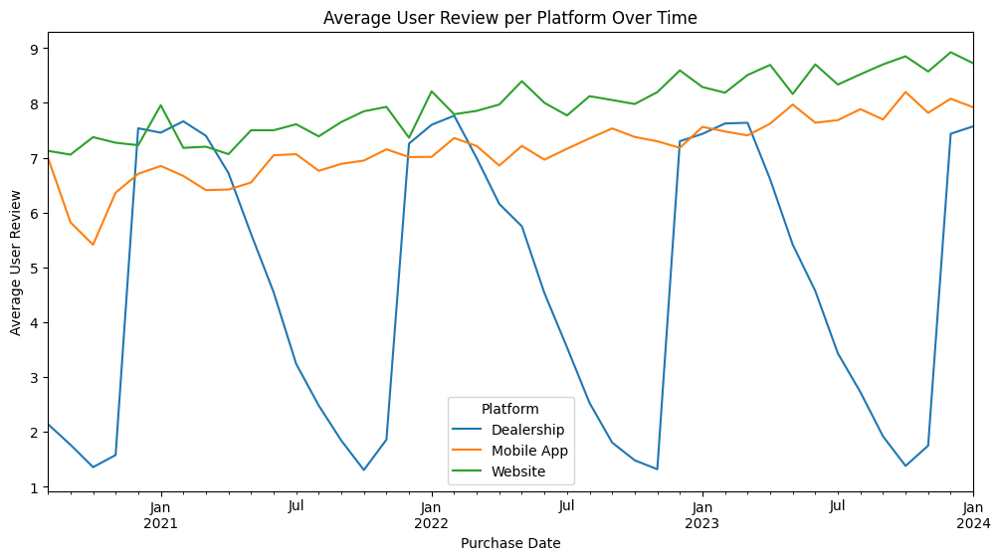

In [27]:
![1733217157478](image/README/1733217157478.png)# Group by platform and purchase date, then calculate the mean user review
avg_reviews = sales.groupby(['platform', sales['purchase_date'].dt.to_period('M')])['user_review'].mean().unstack(level=0)

# Plot the average user review per platform over time
avg_reviews.plot(figsize=(12, 6))
plt.xlabel('Purchase Date')
plt.ylabel('Average User Review')
plt.title('Average User Review per Platform Over Time')
plt.legend(title='Platform')
plt.show()

### Purchase price column

### User review column

In [28]:
# How many users have bought more than one car?
sales[sales['customer_id'].isin(sales['customer_id'].value_counts()[sales['customer_id'].value_counts() > 1].index)]["customer_id"].value_counts()

customer_id
40a8e90c-7b08-4958-9135-0d76684c922c    4
db1482ff-1a20-43c0-94c5-bcacba70d5ea    4
Name: count, dtype: int64

If there were more than two customers, it would be useful to analyze their behaviors in greater detail. This could involve examining their purchasing patterns, preferences for different platforms, and any changes in their buying habits over time. Such an analysis could provide valuable insights into customer loyalty, platform effectiveness, and potential areas for improvement in marketing strategies.

##### Fuel type user satisfaction

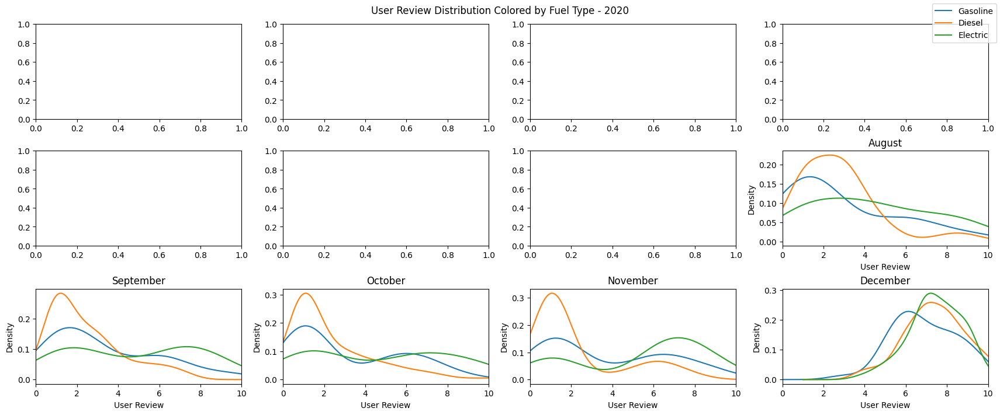

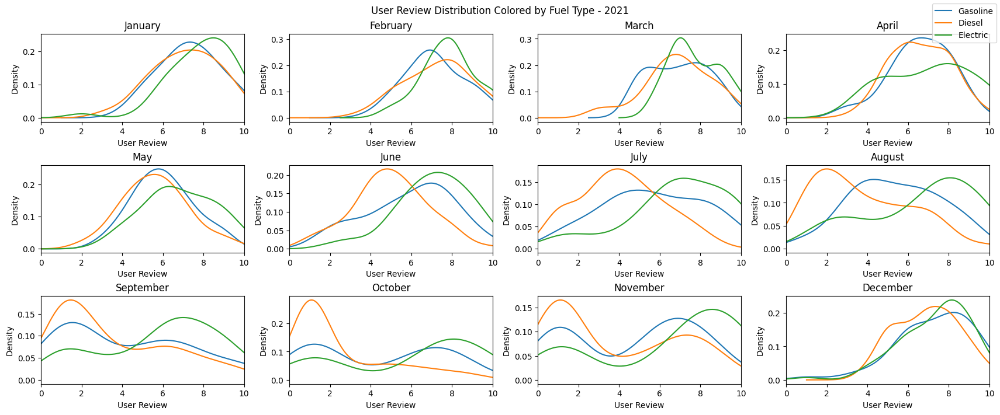

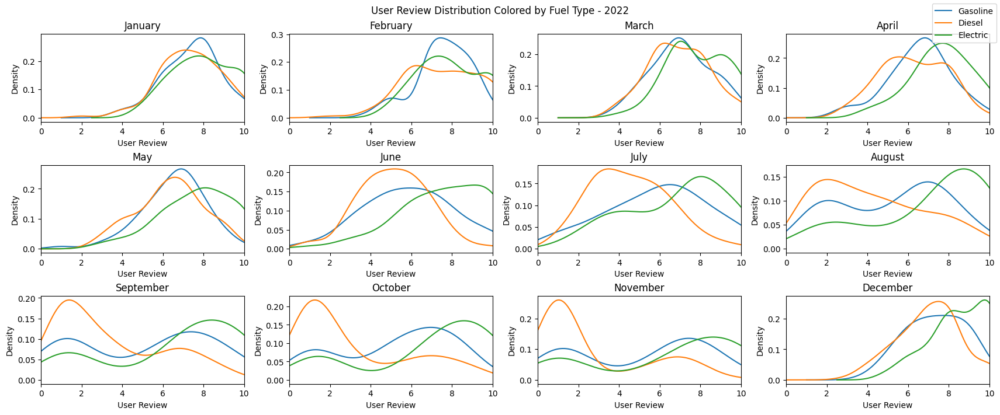

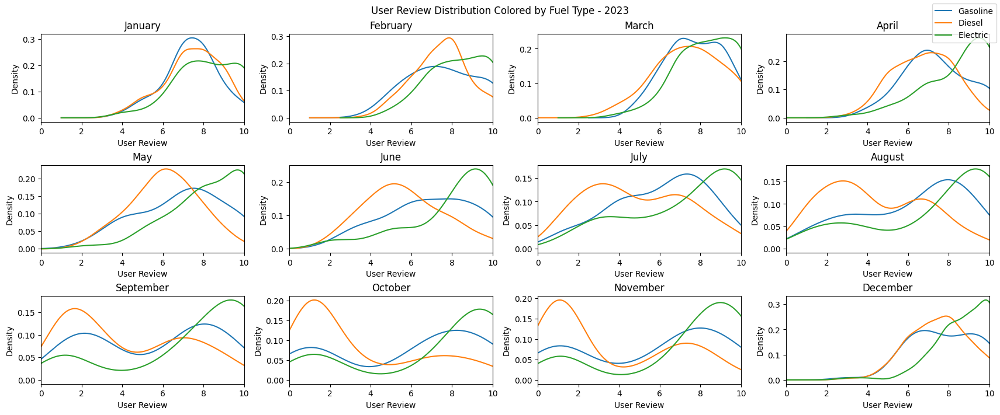

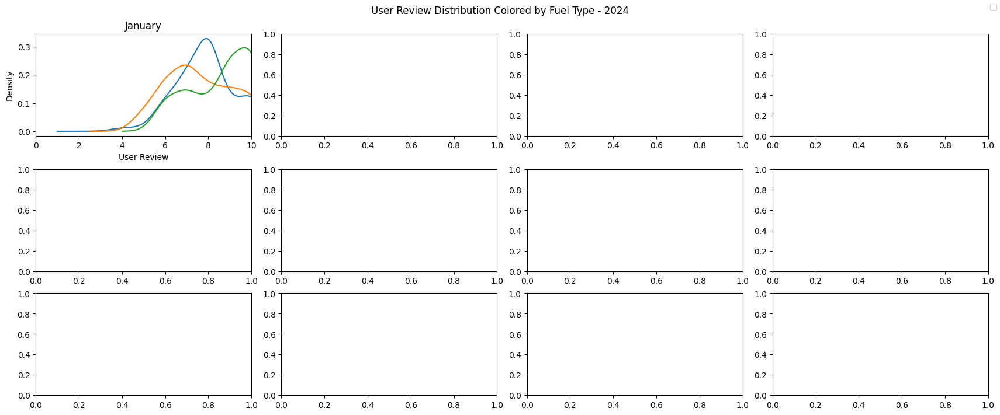

In [29]:
# plot the user review distribution colored by the fuel type year after year
for year in sorted(sales['purchase_date'].dt.year.unique()):
    fig, axs = plt.subplots(3, 4, figsize=(17, 7), constrained_layout=True)
    for i, month in enumerate(range(1, 13)):
        if month in sales[sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique():
            for fuel in sales['fuel_type'].unique():
                sales[(sales['fuel_type'] == fuel) & (sales['purchase_date'].dt.year == year) & (sales['purchase_date'].dt.month == month)]['user_review'].plot(kind='kde', label=fuel, ax=axs[i//4, i%4])
            axs[i//4, i%4].set_title(pd.to_datetime(f'{year}-{month:02d}-01').strftime('%B'))
            axs[i//4, i%4].set_xlabel('User Review')
            axs[i//4, i%4].set_ylabel('Density')
            axs[i//4, i%4].set_xlim(0, 10)
    # add a single legend without duplicate labels
    handles, labels = axs[2, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.suptitle(f'User Review Distribution Colored by Fuel Type - {year}')
    plt.show()

We can see that the 2024 year started in a worse manner of the 2023, when we were plotting a single graph it seemd that the 2024 had the best reviews, but it's not

In this case, we observe that every year, during Q3 and most of Q4, users tend to dislike buying new cars. Let's investigate this trend in more detail by examining user reviews by platform.

##### Platform user satisfaction

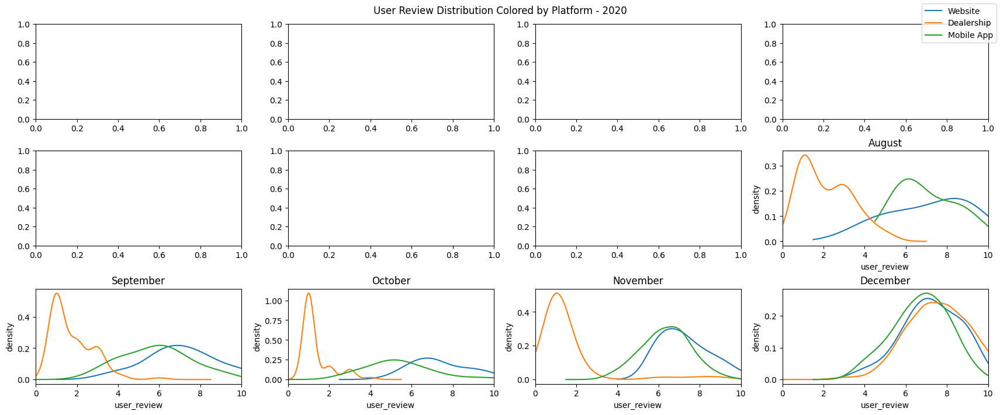

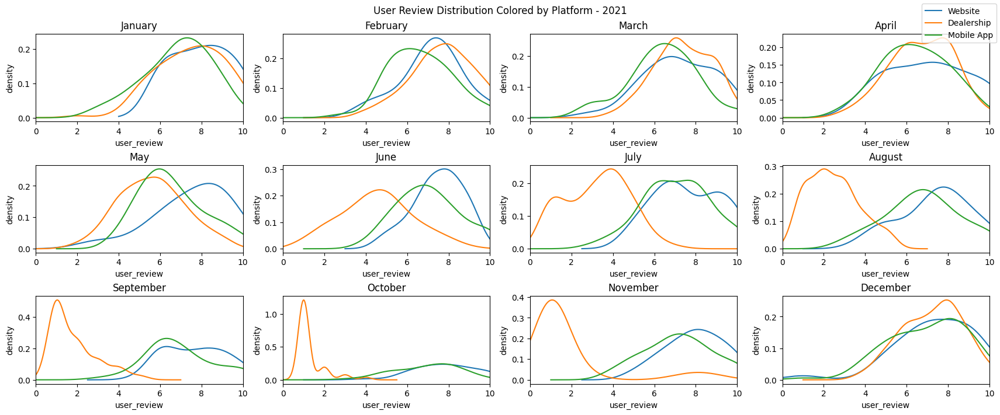

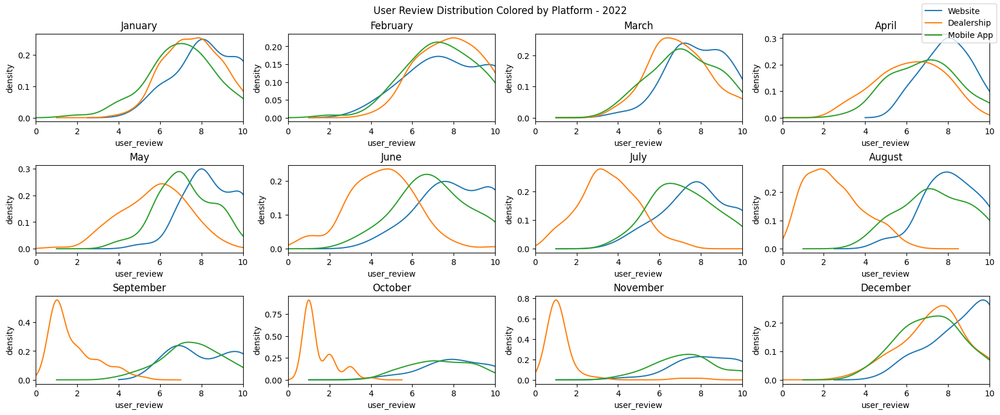

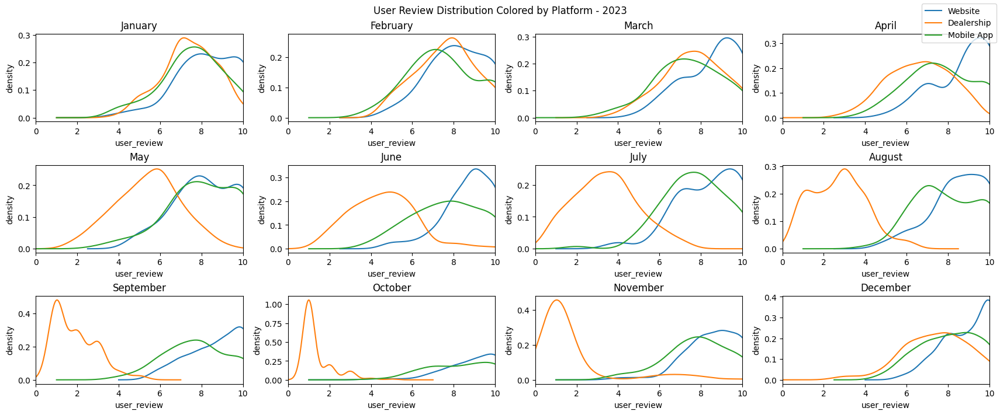

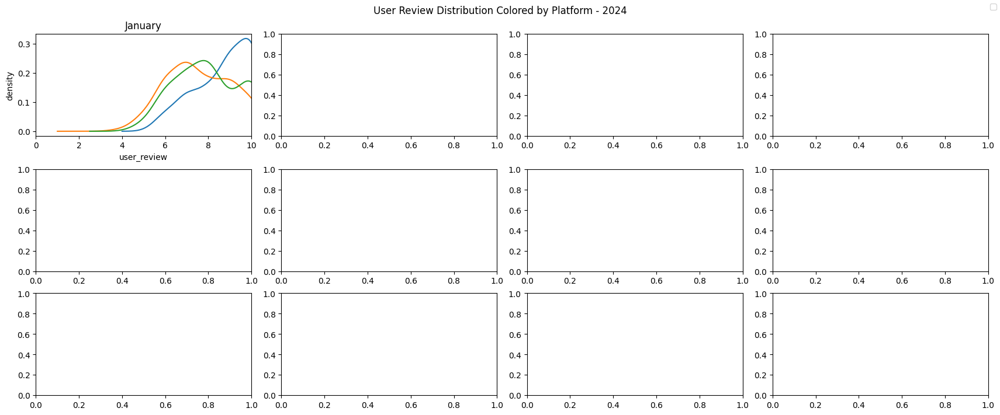

In [30]:
for year in sorted(sales['purchase_date'].dt.year.unique()):
    fig, axs = plt.subplots(3, 4, figsize=(17, 7), constrained_layout=True)
    for i, month in enumerate(range(1, 13)):
        if month in sales[sales['purchase_date'].dt.year == year]['purchase_date'].dt.month.unique():
            for platform in sales['platform'].unique():
                sales[(sales['platform'] == platform) & (sales['purchase_date'].dt.year == year) & (sales['purchase_date'].dt.month == month)]['user_review'].plot(kind='kde', label=platform, ax=axs[i//4, i%4])
            axs[i//4, i%4].set_title(pd.to_datetime(f'{year}-{month:02d}-01').strftime('%B'))
            # add the labels of the axis
            axs[i//4, i%4].set_xlabel('user_review')
            axs[i//4, i%4].set_ylabel('density')
            # set x-axis limits
            axs[i//4, i%4].set_xlim(0, 10)
    # add a single legend without duplicate labels
    handles, labels = axs[2, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.suptitle(year)
    plt.suptitle(f'User Review Distribution Colored by Platform - {year}')
    plt.show()

We can see how the Dealership is the most problematic of them all, every year is the one that struggle the most during the Summer and the Autumn

### Fuel type column

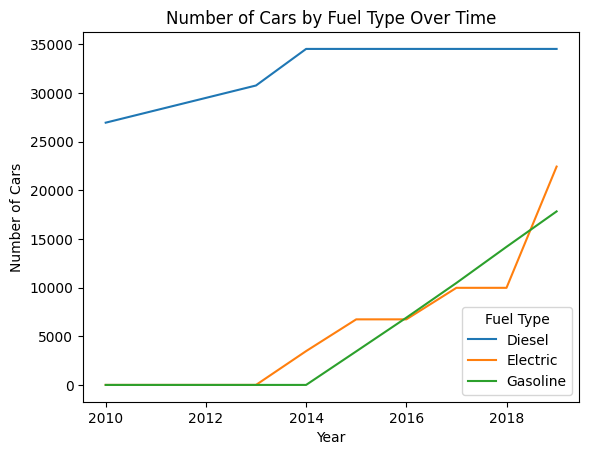

In [31]:
# plot the fuel type distribution colored by the 
sales.groupby([sales['release_date'].dt.year, 'fuel_type']).size().unstack().fillna(0).cumsum().plot()
plt.xlabel('Year')
plt.ylabel('Number of Cars')
plt.title('Number of Cars by Fuel Type Over Time')
plt.legend(title='Fuel Type')
plt.show()

<Figure size 1000x600 with 0 Axes>

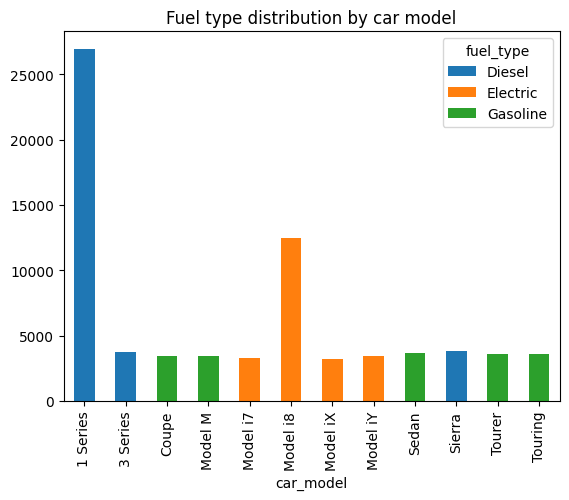

In [32]:
# plot all the models by fuel type
plt.figure(figsize=(10, 6))
sales.groupby('car_model')['fuel_type'].value_counts().unstack().plot(kind='bar', stacked=True)
plt.title('Fuel type distribution by car model')
plt.show()

Here we can see that the diesel ones are the best sellers, except for the i8

| car_model | Sales | Percentage | fuel_type |
|-----------|-------|------------|-----------|
| 1 Series  | 26944 | 36.03      | Diesel    |
| Model i8  | 12456 | 16.66      | Electric  |
| Sierra    | 3819  | 5.11       | Diesel    |
| 3 Series  | 3758  | 5.03       | Diesel    |
| Sedan     | 3712  | 4.96       | Gasoline  |
| Touring   | 3639  | 4.87       | Gasoline  |
| Tourer    | 3570  | 4.77       | Gasoline  |
| Model iY  | 3474  | 4.65       | Electric  |
| Model M   | 3460  | 4.63       | Gasoline  |
| Coupe     | 3446  | 4.61       | Gasoline  |
| Model i7  | 3262  | 4.36       | Electric  |
| Model iX  | 3240  | 4.33       | Electric  |

### Release date column

In [33]:
# Define colors for the car models
colors = px.colors.qualitative.T10

# Group by release date and car model, then count the number of sales
car_model_sales_by_release_date = sales.groupby([sales['release_date'].dt.year, 'car_model']).size().unstack().fillna(0)

# Create the bar plot
fig = go.Figure()

for idx, model in enumerate(car_model_sales_by_release_date.columns):
    fig.add_trace(go.Bar(
        x=car_model_sales_by_release_date.index,
        y=car_model_sales_by_release_date[model],
        name=model,
        marker_color=colors[idx % len(colors)]
    ))

# Group by purchase date and car model, then count the number of sales
car_model_sales_by_purchase_date = sales.groupby([sales['purchase_date'].dt.year, 'car_model']).size().unstack().fillna(0)

# Add the line plot for the cumulative number of cars sold by purchase date
for idx, model in enumerate(car_model_sales_by_purchase_date.columns):
    fig.add_trace(go.Scatter(
        x=car_model_sales_by_purchase_date.index,
        y=car_model_sales_by_purchase_date[model].cumsum(),
        mode='lines+markers',
        name=model,
        line=dict(color=colors[idx % len(colors)], dash='dash')
    ))

# Update layout
fig.update_layout(
    barmode='stack',
    xaxis_title='Year',
    yaxis_title='Number of Sales',
    yaxis2=dict(
        title='Cumulative Number of Sales',
        overlaying='y',
        side='right'
    ),
    title='Number of Car Models Sold by Release Date and Cumulative Sales by Purchase Date',
    legend=dict(title='Car Model', x=1.05, y=1),
    xaxis=dict(tickangle=45)
)

fig.show()

##### car_age_days

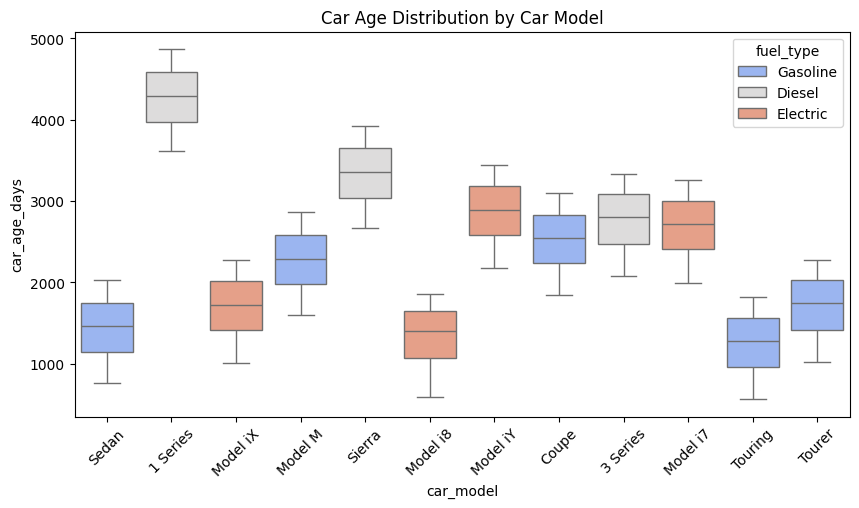

In [34]:
# plot the distribution of the car age by model
plt.figure(figsize=(10, 5))
sns.boxplot(data=sales, x='car_model', y='car_age_days', palette='coolwarm', hue='fuel_type')
plt.xticks(rotation=45)
plt.title('Car Age Distribution by Car Model')
plt.show()

### Gender column

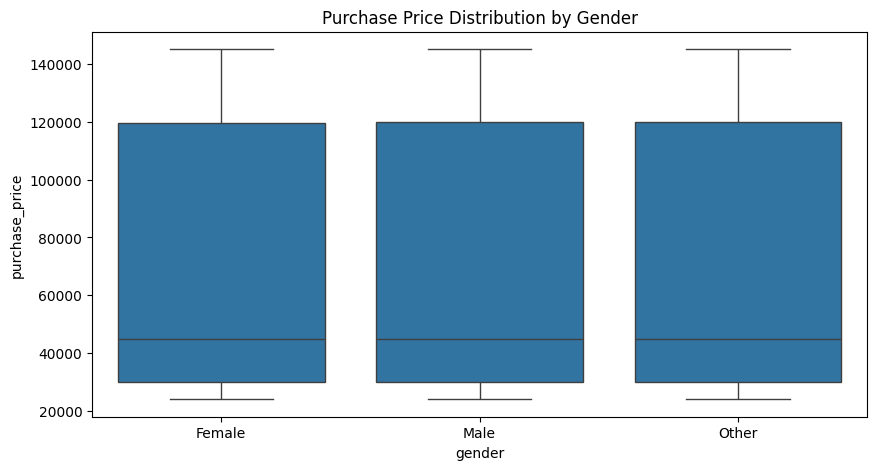

In [35]:
# price vs gender
plt.figure(figsize=(10, 5))
sns.boxplot(data=sales, x='gender', y='purchase_price')
plt.title('Purchase Price Distribution by Gender')
plt.show()

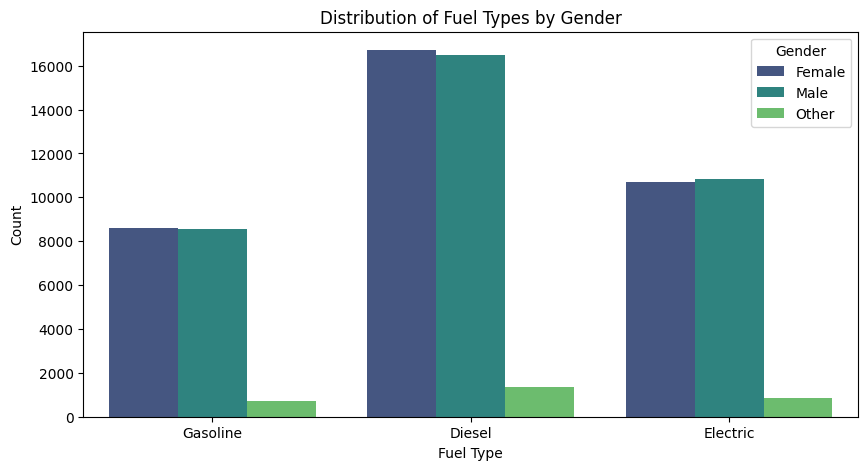

In [36]:
# fuel types by gender
plt.figure(figsize=(10, 5))
sns.countplot(data=sales, x='fuel_type', hue='gender', palette='viridis')
plt.xlabel('Fuel Type')
plt.ylabel('Count')
plt.title('Distribution of Fuel Types by Gender')
plt.legend(title='Gender')
plt.show()

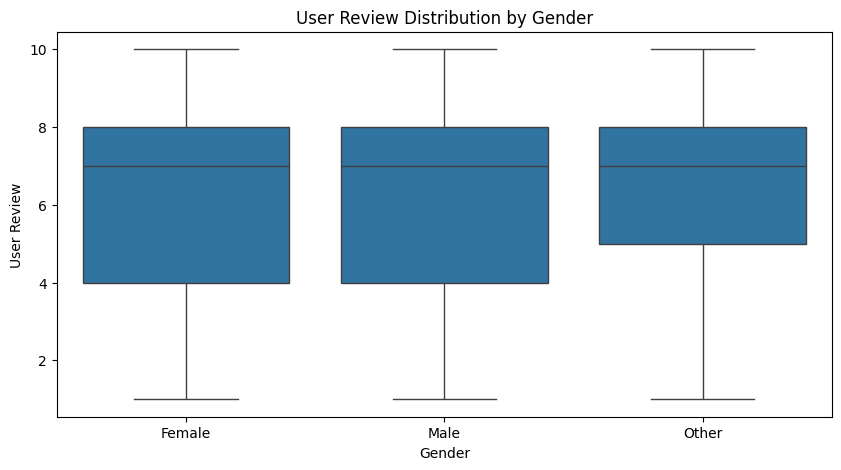

In [37]:
# Plot the user review distribution colored by gender
plt.figure(figsize=(10, 5))
sns.boxplot(data=sales, x='gender', y='user_review')
plt.xlabel('Gender')
plt.ylabel('User Review')
plt.title('User Review Distribution by Gender')
plt.show()

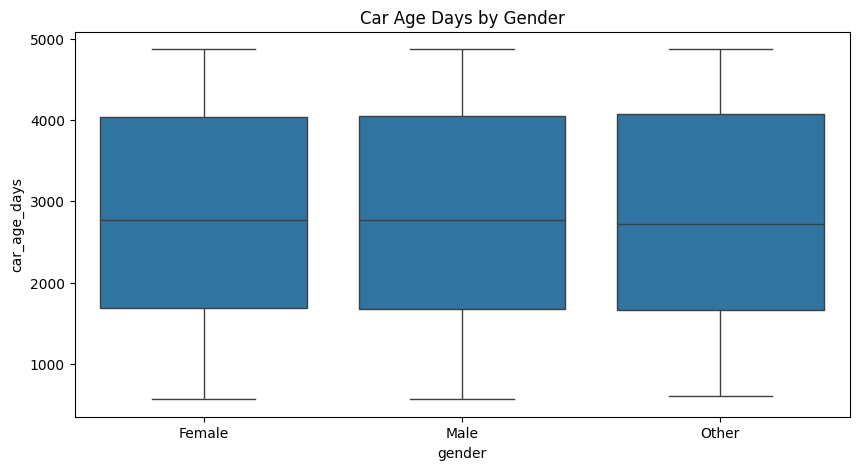

In [38]:
# car age days vs gender
plt.figure(figsize=(10, 5))
sns.boxplot(data=sales, x="gender", y="car_age_days")
plt.title('Car Age Days by Gender')
plt.show()

### Price column

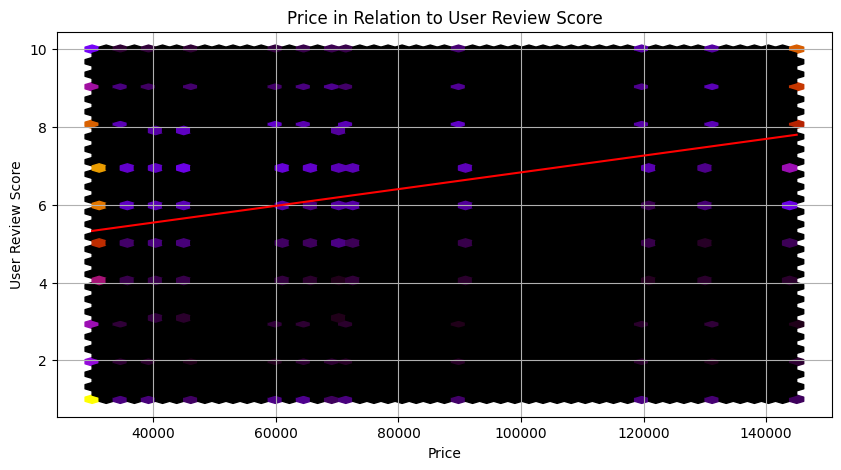

In [39]:
# create a temp variabile
cleaned_sales = sales.dropna(subset=['price', 'user_review'])

# price vs user review
plt.figure(figsize=(10, 5))
plt.hexbin(cleaned_sales['price'], cleaned_sales['user_review'], cmap='gnuplot', gridsize=50)
plt.ylabel('User Review Score')
plt.xlabel('Price')
plt.title('Price in Relation to User Review Score')
plt.grid()

# fit the trend line
z = np.polyfit(cleaned_sales['price'], cleaned_sales['user_review'], 1)
p = np.poly1d(z)

# show the trend line
plt.plot(cleaned_sales['price'], p(cleaned_sales['price']), color='red')

plt.show()

del cleaned_sales

#### Total Income for Each Car Model by Month and Year

In [40]:
# Calculate the total income for each car model by month and year
total_income_by_model_month_year = sales.groupby([sales['purchase_date'].dt.to_period('M'), 'car_model'])['purchase_price'].sum().unstack()

# Create the bar plot
fig = go.Figure()

# Add the bar trace for each car model
for model in total_income_by_model_month_year.columns:
    fig.add_trace(go.Bar(
        x=total_income_by_model_month_year.index.astype(str),
        y=total_income_by_model_month_year[model],
        name=model
    ))

# Update layout
fig.update_layout(
    barmode='stack',
    xaxis_title='Month-Year',
    yaxis_title='Total Income',
    title='Total Income for Each Car Model by Month and Year',
    legend=dict(title='Car Model', x=1.05, y=1),
    xaxis=dict(tickangle=45)
)

fig.show()

We can notice that users who leave higher reviews are usually the ones who spend the most.

#### Difference in the price across the years

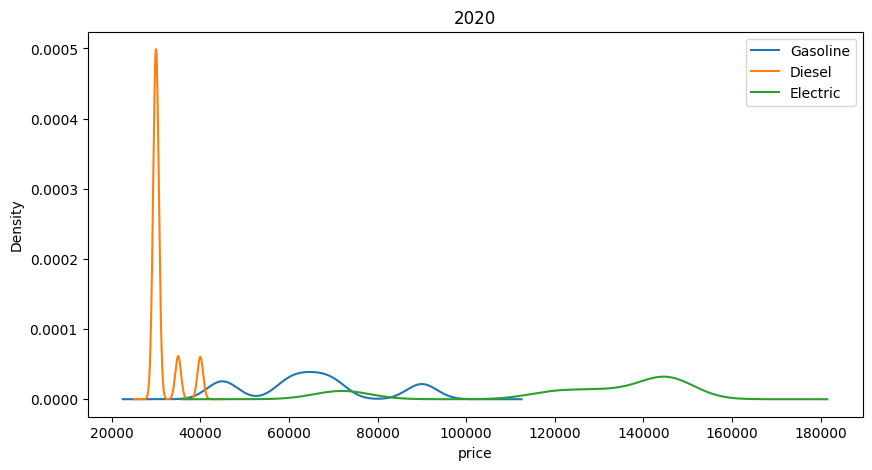

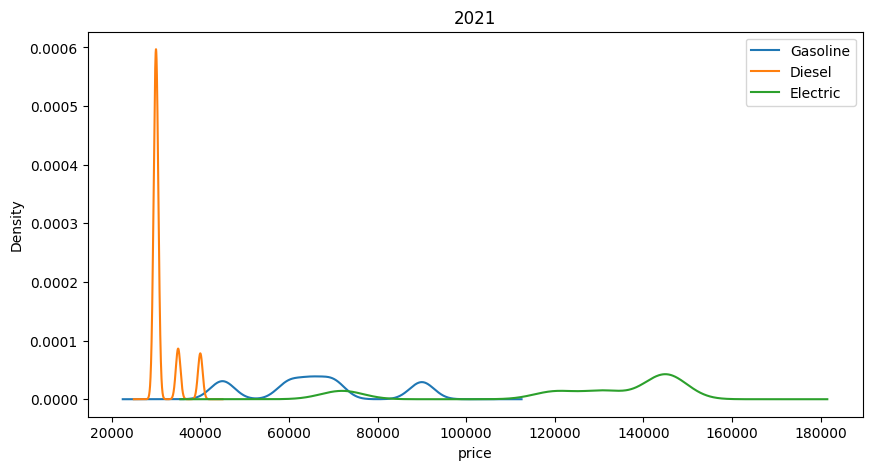

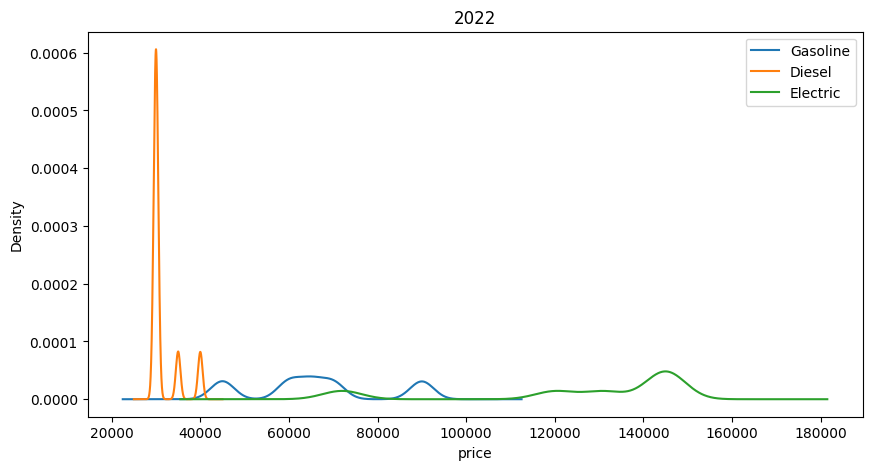

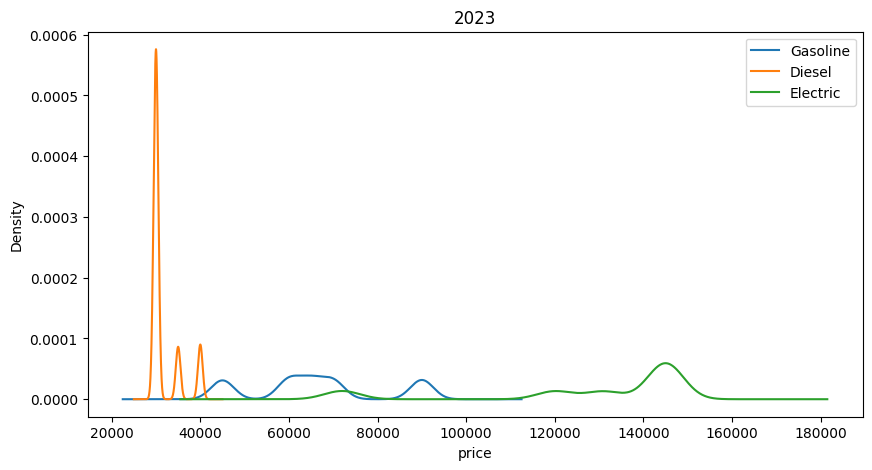

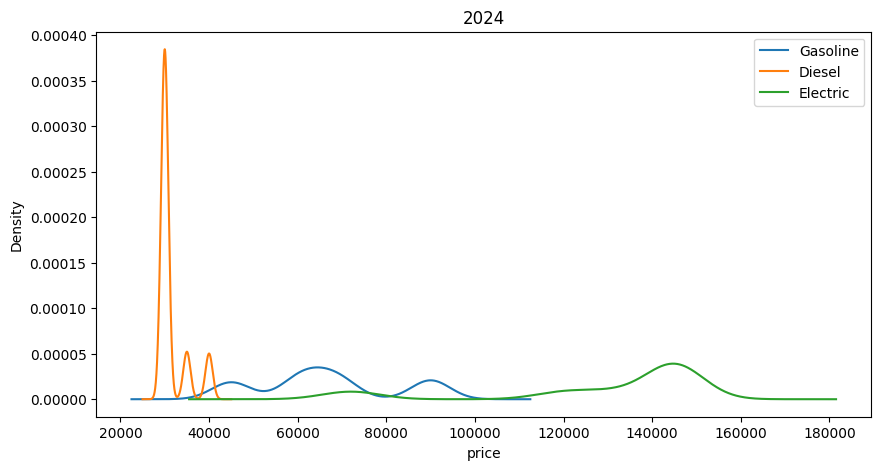

In [41]:
# plot the price distribution colored by the fuel type for every year
for year in sorted(sales['purchase_date'].dt.year.unique()):
    plt.figure(figsize=(10,5))
    for fuel_type in sales['fuel_type'].unique():
        sales[(sales['fuel_type'] == fuel_type) & (sales['purchase_date'].dt.year == year)]['price'].plot(kind='kde', label=fuel_type)
    plt.xlabel('price')
    plt.legend()
    plt.title(year)
    plt.show()

#### Price per model

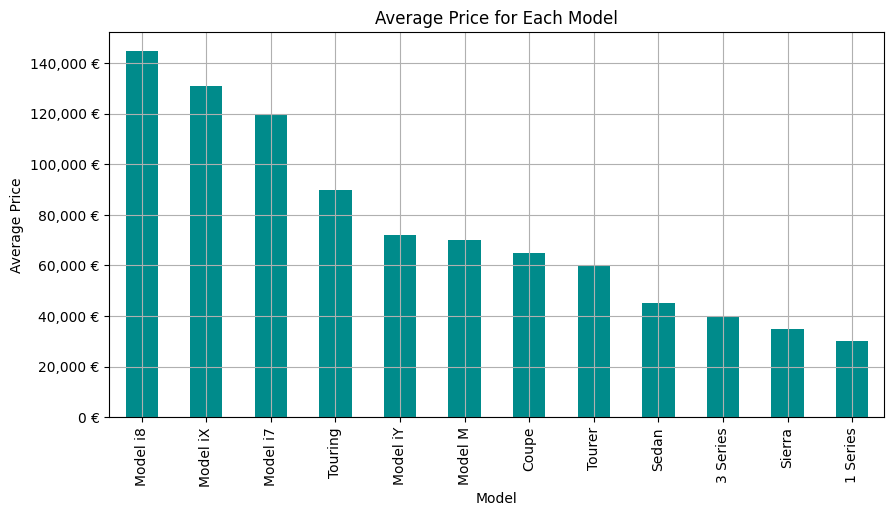

In [42]:
# plot the average price for each model
plt.figure(figsize=(10, 5))
sales.groupby('car_model')['price'].mean().sort_values(ascending=False).plot(kind='bar', color='darkcyan')
plt.xlabel('Model')
plt.ylabel('Average Price')
plt.title('Average Price for Each Model')
plt.grid()
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,} €".format(int(x))))
plt.show()


Text(0, 0.5, 'Price')

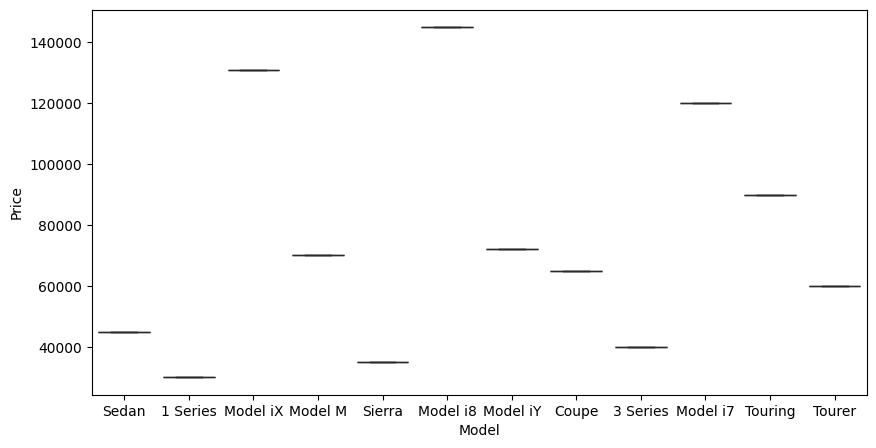

In [43]:
# boxplot of the price for each model
plt.figure(figsize=(10, 5))
sns.boxplot(x='car_model', y='price', data=sales, color='darkcyan')
plt.xlabel('Model')
plt.ylabel('Price')

### Car Model column

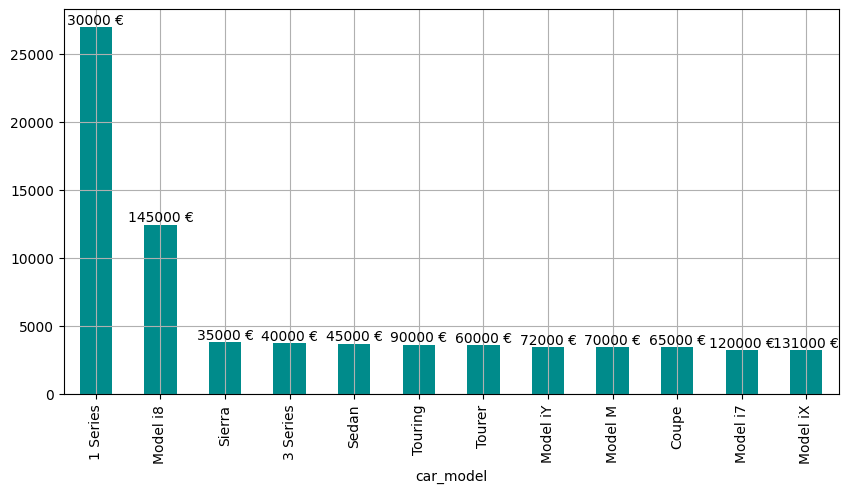

In [44]:
# plot the number of purchases for each car model
ax = sales['car_model'].value_counts().plot(kind='bar', color='darkcyan', figsize=(10, 5))

# add the price of the models
for i, p in enumerate(ax.patches):
    model = sales['car_model'].value_counts().index[i]
    price = cars[cars['car_model'] == model].iloc[0]['price']
    ax.annotate(f'{price} €', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.grid()
plt.show()

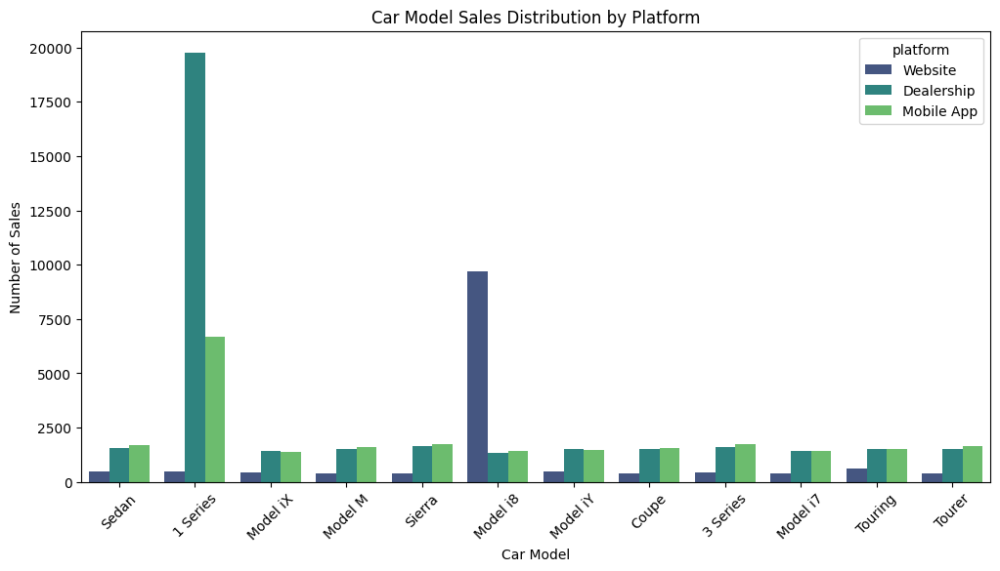

In [45]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Create a count plot for car model sales distribution colored by the platform
sns.countplot(data=sales, x='car_model', hue='platform', palette='viridis')

# Set the title and labels
plt.title('Car Model Sales Distribution by Platform')
plt.xlabel('Car Model')
plt.ylabel('Number of Sales')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

In [ ]:
# Define darker color palettes for "1 Series" and "Model i8"
palette_1_series = px.colors.sequential.Reds_r
palette_model_i8 = px.colors.sequential.Blues_r

# Filter the sales data for the car models "1 Series" and "Model i8"
filtered_sales = sales[sales['car_model'].isin(['1 Series', 'Model i8'])]

# Group by year, month, car model, and platform, then count the number of sales
sales_by_month_year_model_platform = filtered_sales.groupby([filtered_sales['purchase_date'].dt.to_period('M'), 'car_model', 'platform']).size().unstack(level=-1).fillna(0)

# Create the plot
fig = go.Figure()

# Add traces for "1 Series"
for i, platform in enumerate(sales_by_month_year_model_platform.columns):
    fig.add_trace(go.Scatter(
        x=sales_by_month_year_model_platform.index.get_level_values(0).astype(str).unique(),
        y=sales_by_month_year_model_platform.loc[(slice(None), '1 Series'), platform],
        mode='lines+markers',
        name=f'1 Series - {platform}',
        line=dict(color=palette_1_series[i % len(palette_1_series)])
    ))

# Add traces for "Model i8"
for i, platform in enumerate(sales_by_month_year_model_platform.columns):
    fig.add_trace(go.Scatter(
        x=sales_by_month_year_model_platform.index.get_level_values(0).astype(str).unique(),
        y=sales_by_month_year_model_platform.loc[(slice(None), 'Model i8'), platform],
        mode='lines+markers',
        name=f'Model i8 - {platform}',
        line=dict(color=palette_model_i8[i % len(palette_model_i8)])
    ))

# Update layout
fig.update_layout(
    title='Sales of "1 Series" and "Model i8" by Platform Over the Months',
    xaxis_title='Month-Year',
    yaxis_title='Number of Sales',
    legend_title='Car Model - Platform',
    template='plotly_white'
)

fig.show()

The data indicates that the Dealership heavily relies on the sales of the "1 Series". This trend suggests that customers with a budget for the "1 Series" prefer to purchase in person, likely due to trust factors associated with face-to-face transactions.<br>Interestingly, there has been a noticeable increase in "1 Series" buyers using the Mobile App, although the Dealership remains the preferred purchasing method as of January 2024.

The ‘Model i8’, on the other hand, is aimed at a different customer segment with different needs, which is why most of these customers prefer to use the website for their purchases. The ‘Model i8’ is a high-end electric vehicle and its buyers probably prefer to buy online instead of going to the dealership in person.

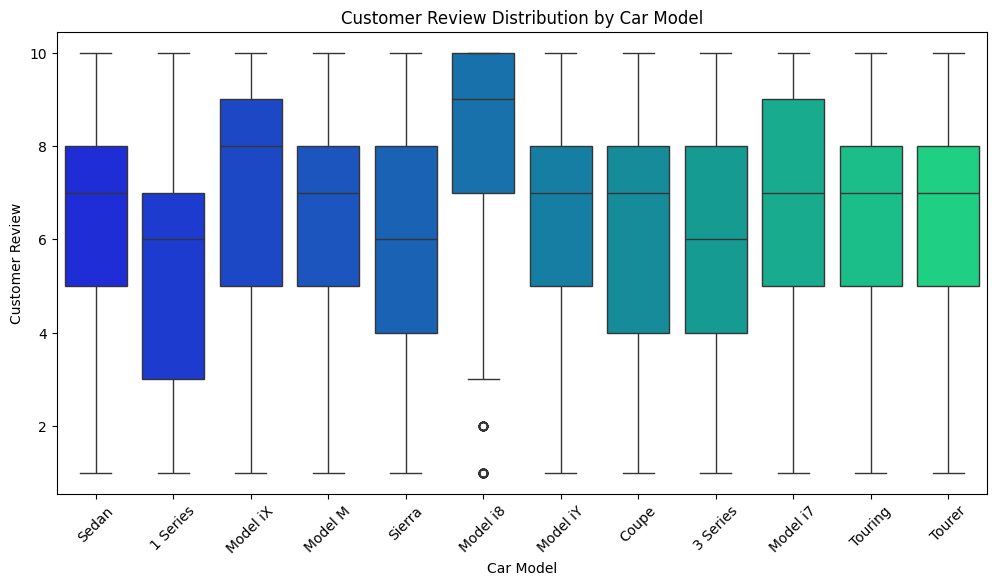

In [47]:
# plot the customer review for each car model
plt.figure(figsize=(12, 6))
sns.boxplot(data=sales, x='car_model', y='user_review', palette='winter', hue='car_model', legend=False)
plt.title('Customer Review Distribution by Car Model')
plt.xlabel('Car Model')
plt.ylabel('Customer Review')
plt.xticks(rotation=45)
plt.show()

This explains a lot of the trends that we saw in the sales

In [48]:
# save the data
sales.to_csv('Modified_Data/sales.csv', index=False)